In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("churn.csv")
df.head()

,Unnamed: 0,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn
0,0,106473,15639576,Sarratt,652.0,France,Female,65.0,3,0.00,2,1,1,136592.24,0
1,1,62345,15769582,Hanson,464.0,France,Male,35.0,4,0.00,1,0,0,99505.75,1
2,2,126615,15675888,Austin,620.0,Germany,Female,39.0,6,129401.87,2,1,1,102681.32,1
3,3,35909,15786617,Tuan,598.0,France,Female,30.0,7,0.00,2,1,0,141210.18,0
4,4,45175,15757310,Li Fonti,682.0,Germany,Female,46.0,4,107720.57,1,0,0,93832.33,1


- Churn = 0: This means that the customer has not churned; they are still an active customer. This indicates retention.
- Churn = 1: This indicates that the customer has churned; they are no longer an active customer. This reflects attrition or loss of the customer.

# Data Cleaning

In [4]:
df.info()
#theres a null column which is "CreditScore"

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41259 entries, 0 to 41258
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       41259 non-null  int64  
 1   id               41259 non-null  int64  
 2   CustomerId       41259 non-null  int64  
 3   Surname          41259 non-null  object 
 4   CreditScore      41251 non-null  float64
 5   Geography        41259 non-null  object 
 6   Gender           41259 non-null  object 
 7   Age              41259 non-null  float64
 8   Tenure           41259 non-null  int64  
 9   Balance          41259 non-null  float64
 10  NumOfProducts    41259 non-null  int64  
 11  HasCrCard        41259 non-null  int64  
 12  IsActiveMember   41259 non-null  int64  
 13  EstimatedSalary  41259 non-null  float64
 14  churn            41259 non-null  int64  
dtypes: float64(4), int64(8), object(3)
memory usage: 4.7+ MB


### fill in empty values

In [3]:
df["CreditScore"] = df["CreditScore"].fillna(df["CreditScore"].mean())
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41259 entries, 0 to 41258
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       41259 non-null  int64  
 1   id               41259 non-null  int64  
 2   CustomerId       41259 non-null  int64  
 3   Surname          41259 non-null  object 
 4   CreditScore      41259 non-null  float64
 5   Geography        41259 non-null  object 
 6   Gender           41259 non-null  object 
 7   Age              41259 non-null  float64
 8   Tenure           41259 non-null  int64  
 9   Balance          41259 non-null  float64
 10  NumOfProducts    41259 non-null  int64  
 11  HasCrCard        41259 non-null  int64  
 12  IsActiveMember   41259 non-null  int64  
 13  EstimatedSalary  41259 non-null  float64
 14  churn            41259 non-null  int64  
dtypes: float64(4), int64(8), object(3)
memory usage: 4.7+ MB


no null data

### checking duplicated values

In [4]:
df.duplicated().sum()

np.int64(0)

no duplicated rows

### removing some unecessary columns

In [5]:
df.drop(columns=["Unnamed: 0","id","CustomerId","Surname"], inplace=True)
df.head()  

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn
0,652.0,France,Female,65.0,3,0.00,2,1,1,136592.24,0
1,464.0,France,Male,35.0,4,0.00,1,0,0,99505.75,1
2,620.0,Germany,Female,39.0,6,129401.87,2,1,1,102681.32,1
3,598.0,France,Female,30.0,7,0.00,2,1,0,141210.18,0
4,682.0,Germany,Female,46.0,4,107720.57,1,0,0,93832.33,1


### cardinality checking
Cardinality checking is used to view the unique values for each variable to identify any incorrect input data

In [34]:
discrete_columns = ["Tenure", "NumOfProducts", "HasCrCard", "IsActiveMember", "churn"]
discrete_columns.extend(df.select_dtypes("object").columns.tolist())

unique = [df[name].value_counts() for name in discrete_columns]
unique

[Tenure
 2     4588
 4     4442
 7     4431
 5     4291
 8     4232
 3     4231
 1     4177
 9     4173
 6     3970
 10    1474
 0     1250
 Name: count, dtype: int64,
 NumOfProducts
 2    21132
 1    19316
 3      694
 4      117
 Name: count, dtype: int64,
 HasCrCard
 1    31126
 0    10133
 Name: count, dtype: int64,
 IsActiveMember
 0    20767
 1    20492
 Name: count, dtype: int64,
 churn
 0    32540
 1     8719
 Name: count, dtype: int64,
 Geography
 France     23520
 Spain       9081
 Germany     8658
 Name: count, dtype: int64,
 Gender
 Male      23166
 Female    18093
 Name: count, dtype: int64]

- there's no typo
- from here we can see that there're some imbalance in variables such as "NumOfProducts", "HasCrCard" and the target variables "churn"

### checking some error values by its range
eg: error values like minus for column "Age"

In [6]:
for col in df.select_dtypes(include="number").columns:
    print(f"the range of col-{col} uis between {df[col].min()} to {df[col].max()}")

the range of col-CreditScore uis between 350.0 to 850.0
the range of col-Age uis between 18.0 to 92.0
the range of col-Tenure uis between 0 to 10
the range of col-Balance uis between 0.0 to 250898.09
the range of col-NumOfProducts uis between 1 to 4
the range of col-HasCrCard uis between 0 to 1
the range of col-IsActiveMember uis between 0 to 1
the range of col-EstimatedSalary uis between 11.58 to 199992.48
the range of col-churn uis between 0 to 1


There are no errors in the values

# Data Preprocessing

### Checking & Handling Outliers
i dont include both of the imbalance variables bcs it will detect that the minority values are all outliers

In [7]:
check_col = [col for col in df.select_dtypes("number").columns if col not in ["HasCrCard","churn", "NumOfProducts"]]

df_clean = df.copy()

for col in check_col:
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    IQR = q3 - q1
    outliers = df[(df[col] < (q1- 1.5*IQR)) | (df[col] > (q3 + 1.5*IQR))]
    df_clean = df_clean[~df_clean.index.isin(outliers.index)]
    print(f"{col}: {len(outliers)}")

print(f"total number of the outliers is {len(df)-len(df_clean)}")

CreditScore: 76
Age: 1560
Tenure: 0
Balance: 0
IsActiveMember: 0
EstimatedSalary: 0
total number of the outliers is 1631


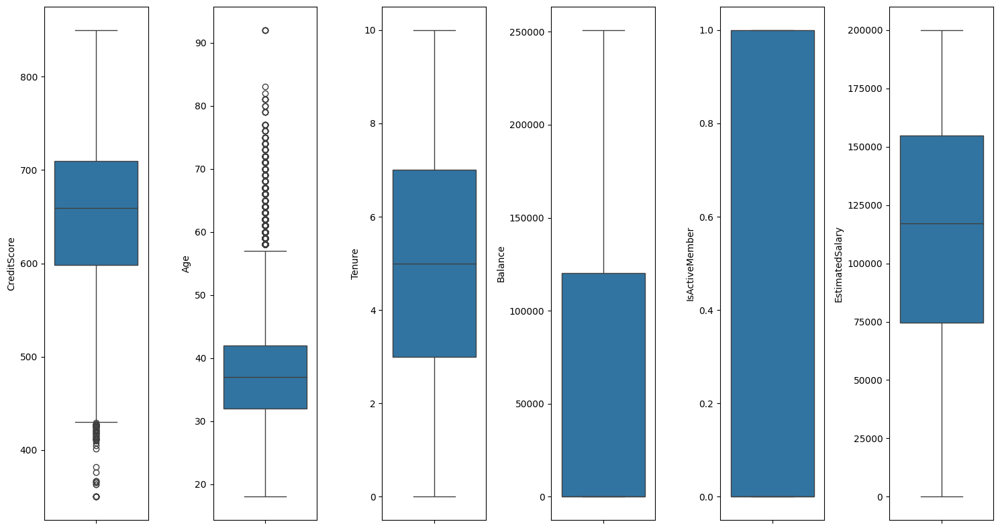

In [23]:
fig,axes = plt.subplots(1, len(check_col), figsize=(15,8))
axes = axes.flatten()

for ax, col in zip(axes, check_col):
    sns.boxplot(data=df, y=col, ax=ax)

plt.tight_layout()

I don't want to remove all the outliers since they may contain valuable information. Instead, I will delete some based on a threshold determined from this boxplot

In [6]:
df_clean = df[~((df["Age"] > 80) | (df["CreditScore"] < 400))]

print(len(df_clean))
print(len(df)-len(df_clean))

41230
29


With this approach, 29 rows were deleted. This way, we minimize the loss of information while enhancing the clustering process

### Feature Encoding

In [8]:
geo = {'France': 0, 'Germany': 1, 'Spain': 2}
gender = {'Female': 0, 'Male': 1}

df_enco = df_clean.copy()
df_enco['Geography'] = df_clean['Geography'].replace(geo)
df_enco['Gender'] = df_clean['Gender'].replace(gender)

df_enco.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn
0,652.0,0,0,65.0,3,0.00,2,1,1,136592.24,0
1,464.0,0,1,35.0,4,0.00,1,0,0,99505.75,1
2,620.0,1,0,39.0,6,129401.87,2,1,1,102681.32,1
3,598.0,0,0,30.0,7,0.00,2,1,0,141210.18,0
4,682.0,1,0,46.0,4,107720.57,1,0,0,93832.33,1


### Scalling

In [24]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_enco)

df_scaled = pd.DataFrame(df_scaled, columns=df_enco.columns)
df_scaled.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn
0,-0.054894,-0.795349,-1.131612,3.074333,-0.713357,-0.886292,0.816921,0.570573,1.006668,0.482096,-0.517641
1,-2.410281,-0.795349,0.883695,-0.347590,-0.356532,-0.886292,-1.016194,-1.752626,-0.993376,-0.254164,1.931841
2,-0.455811,0.428608,-1.131612,0.108667,0.357120,1.172330,0.816921,0.570573,1.006668,-0.191121,1.931841
3,-0.731441,-0.795349,-1.131612,-0.917910,0.713946,-0.886292,0.816921,0.570573,-0.993376,0.573774,-0.517641
4,0.320966,0.428608,-1.131612,0.907115,-0.356532,0.827407,-1.016194,-1.752626,-0.993376,-0.366796,1.931841


StandardScaler for scaling is generally a good practice before clustering. This's because clustering algorithms like K-Means and DBSCAN rely on distance measurements, and features with larger ranges can disproportionately influence the results

# Clustering

In [25]:
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.model_selection import ParameterGrid
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px

## k-means clustering - attempt1

In [16]:
silhouette_list=[]
inertia =[]

for k in range(2,10):
    kmean_model = KMeans(n_clusters=k)
    kmean_elbow = kmean_model.fit(df_enco)
    kmean_model = kmean_model.fit_predict(df_enco)
    silhouette_avg = silhouette_score(df_enco, kmean_model)
    
    print(f"nilai k: {k} dengan score {silhouette_avg}")
    silhouette_list.append(silhouette_avg)
    inertia.append(kmean_elbow.inertia_)
    
best_k = np.argmax(silhouette_list)
print(f"best k:{best_k+2} dengan nilai {silhouette_list[best_k]} ")

nilai k: 2 dengan score 0.12049197130599151

nilai k: 3 dengan score 0.12281296973093377

nilai k: 4 dengan score 0.0939506731248288

nilai k: 5 dengan score 0.11778098628480518

nilai k: 6 dengan score 0.10592022636478413

nilai k: 7 dengan score 0.1060343844332714

nilai k: 8 dengan score 0.10934476909428073

nilai k: 9 dengan score 0.0980622423049429

best k:3 dengan nilai 0.12281296973093377 


Looping through a range of numbers to find the best clusters using the silhouette approach, the output shows that the optimal number of clusters is 3, with the highest silhouette score

In [27]:
kmodel = KMeans(n_clusters=3)
predict = kmodel.fit_predict(df_scaled)
df_clean["kmeans"] = predict
df_clean["kmeans"] = df_clean["kmeans"].map({0: 1, 1: 2, 2: 3})
df_enco["kmeans"] = df_clean["kmeans"]
df_clean["kmeans"].value_counts()

kmeans
2    19739
3    12848
1     8643
Name: count, dtype: int64

After predicting with the KMeans algorithm, adjust the cluster labels by adding 1 to each value to avoid having a cluster labeled as 0

### pca to show graph
PCA (Principal Component Analysis) is a technique for dimensionality reduction. It condenses the original 28 columns into just 3 columns, which allows for a 3D plot to visualize the distribution of the data along with its clusters

In [29]:
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(df_pca, columns=["col1","col2","col3"])
df_pca["kmeans"] = df_clean["kmeans"]
df_pca.head()

,col1,col2,col3,kmeans
0,0.064624,-1.749582,-1.244061,2.0
1,1.060785,-0.976035,0.611480,1.0
2,1.280123,-0.419402,-0.404345,1.0
3,-1.189431,-1.488886,1.060774,2.0
4,2.833882,-0.580103,-1.261590,1.0


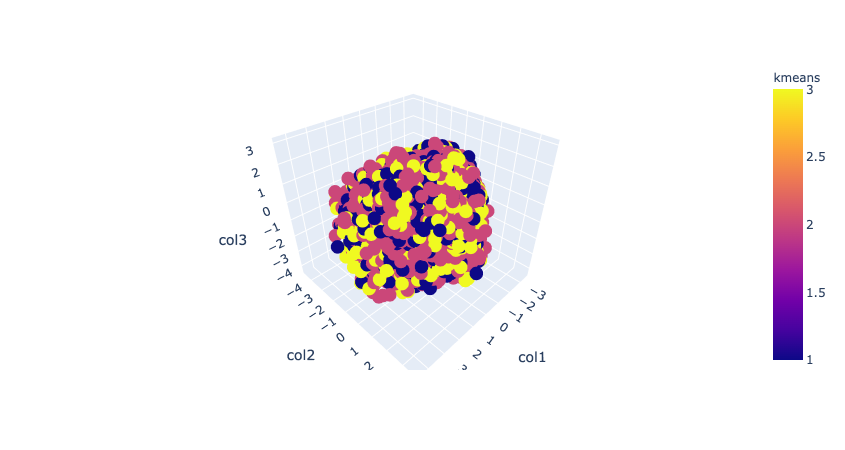

In [31]:
px.scatter_3d(df_pca, x="col1", y="col2", z="col3", color="kmeans")

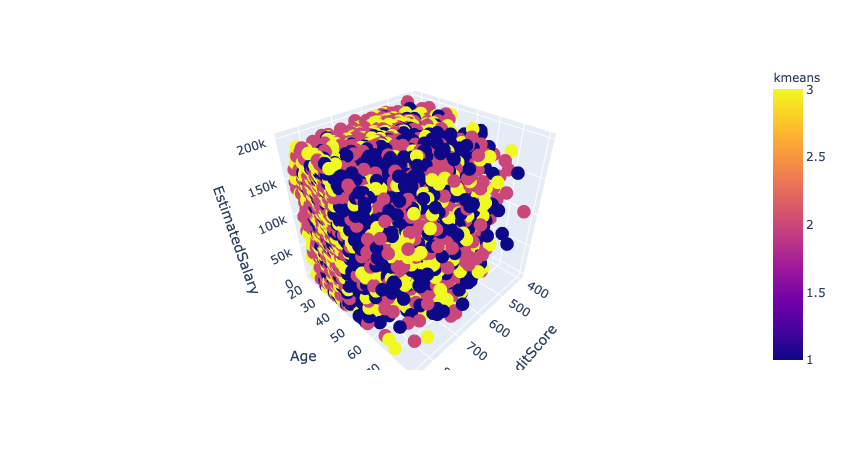

In [33]:
px.scatter_3d(df_enco, x="CreditScore", y="Age", z="EstimatedSalary", color="kmeans")

### Reasons?
The output is so messy. This is because, in this first approach, I didn't reduce the dimensionality of this huge dataset, which contains 41,230 rows (df_clean). Finding the best k and visualizing the clusters might lead to unclear or overlapping clusters due to the high dimensionality. To improve the results, reducing the dimension with PCA should be applied before finding the best n_cluster and clustering

## k-means clustering - attempt2

[0.15444128 0.10829564 0.09346267 0.09170798 0.09123884 0.08984566

 0.08915133 0.0882373  0.08540721 0.05646912 0.05174298]


Text(0, 0.5, 'Cumulative Explained Variance')

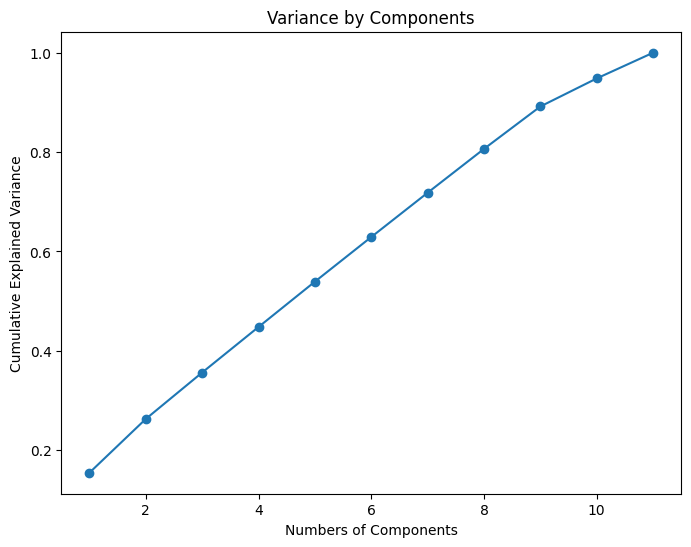

In [17]:
pca = PCA()
pca.fit(df_scaled)
print(pca.explained_variance_ratio_)

plt.figure(figsize=(8,6))
plt.plot(range(1,12), pca.explained_variance_ratio_.cumsum(), marker="o")
plt.title("Variance by Components")
plt.xlabel("Numbers of Components")
plt.ylabel("Cumulative Explained Variance")

The plot doesn’t exhibit a clear elbow or point where the curve starts to flatten out, making it difficult to decide the ideal number of components. But I will choose 3 components because it usually provides a good balance between simplicity and retaining enough information for effective clustering. In addition, it can be plotted as well

In [26]:
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(df_pca, columns=["col1","col2","col3"])
df_pca.head()

,col1,col2,col3
0,0.064624,-1.749582,-1.244061
1,1.060785,-0.976035,0.611480
2,1.280123,-0.419402,-0.404345
3,-1.189431,-1.488886,1.060774
4,2.833882,-0.580103,-1.261590


In [20]:
silhouette_list=[]
inertia =[]

for k in range(2,8):
    kmean_model = KMeans(n_clusters=k)
    kmean_elbow = kmean_model.fit(df_pca)
    kmean_model = kmean_model.fit_predict(df_pca)
    silhouette_avg = silhouette_score(df_pca, kmean_model)
    
    print(f"nilai k: {k} dengan score {silhouette_avg}")
    silhouette_list.append(silhouette_avg)
    inertia.append(kmean_elbow.inertia_)
    
best_k = np.argmax(silhouette_list)
print(f"best k:{best_k+2} dengan nilai {silhouette_list[best_k]} ")

nilai k: 2 dengan score 0.3208107137634502

nilai k: 3 dengan score 0.33085482286747586

nilai k: 4 dengan score 0.31951021912452443

nilai k: 5 dengan score 0.3067107288619547

nilai k: 6 dengan score 0.28494466903656307

nilai k: 7 dengan score 0.27416493221413957


KeyboardInterrupt: 

from the output, it shows that the optimal number of cluster is 3 with the highest silhouette score

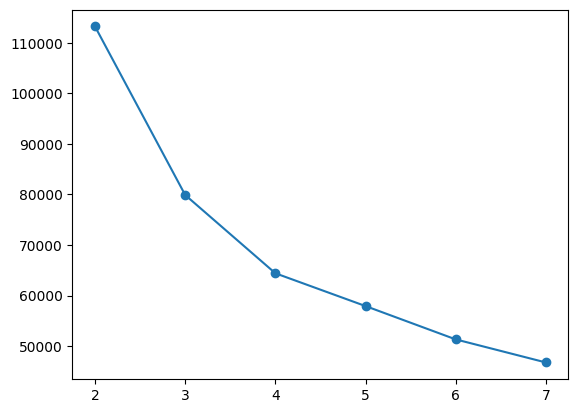

In [23]:
plt.plot(range(2,8), inertia, marker="o")

But looking at the elbow graph, the point where it levels off is at 4. Because of this uncertainty, I'm going to create 2 different models

#### n_cluster=3

In [98]:
kmodel = KMeans(n_clusters=3)
predict = kmodel.fit_predict(df_pca)
df_pca["kmeans"] = predict
df_enco["kmeans"] = predict
df_clean["kmeans"] = predict

df_enco["kmeans"].value_counts()

kmeans
0    18425
1    13942
2     8863
Name: count, dtype: int64

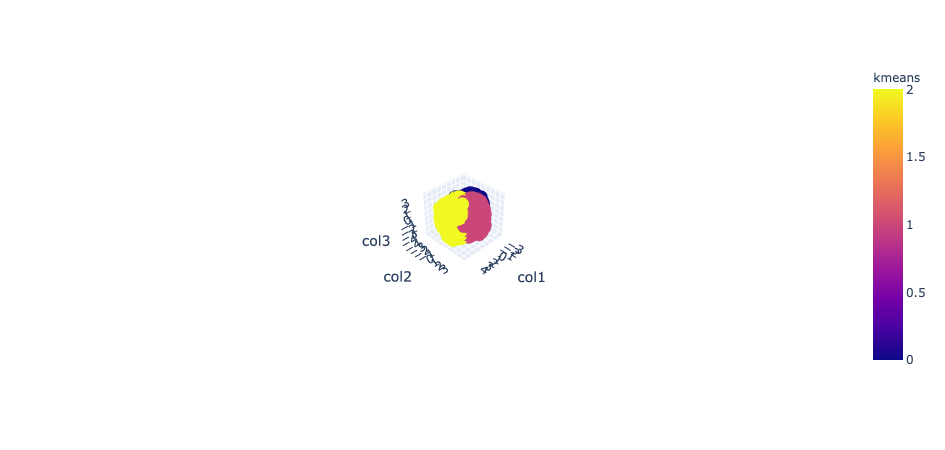

In [99]:
px.scatter_3d(df_pca, x="col1", y="col2", z="col3", color="kmeans")

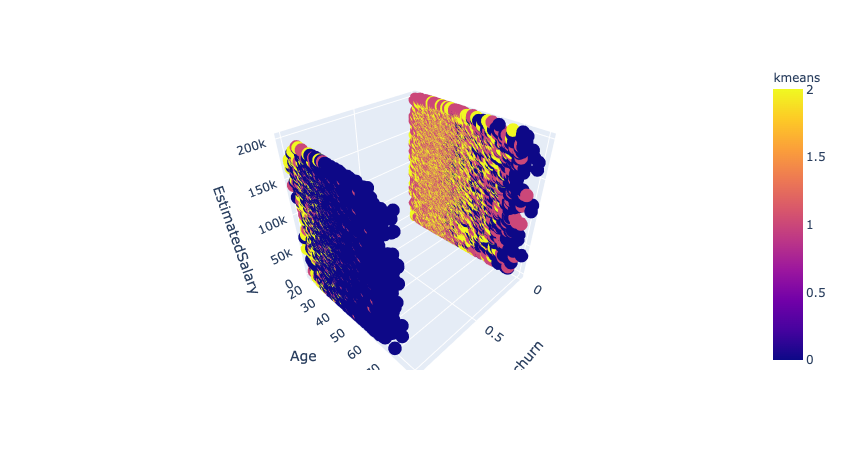

In [69]:
px.scatter_3d(df_enco, x="churn", y="Age", z="EstimatedSalary", color="kmeans")

#### n_cluster = 4

In [27]:
kmodel = KMeans(n_clusters=4)
predict = kmodel.fit_predict(df_pca)
df_pca["kmeans2"] = predict
df_enco["kmeans2"] = predict
df_clean["kmeans2"] = predict

df_enco["kmeans2"].value_counts()

kmeans2
0    17263
3    13437
2     5354
1     5176
Name: count, dtype: int64

In [28]:
px.scatter_3d(df_pca, x="col1", y="col2", z="col3", color="kmeans2")

In [29]:
px.scatter_3d(df_enco, x="churn", y="Age", z="EstimatedSalary", color="kmeans2")

Both displays with different numbers of `n_clusters` appear perfectly fine. The choice ultimately depends on business understanding and decision-making

### Summary for k-mean & Conclusion

#### n_clusters=3

In [205]:
summary_numeric = {}

for i in range(3):
    summary_numeric[i] = pd.DataFrame(df_enco[df_enco["kmeans"] == i].describe())

print("summary_cluster0")
summary_numeric[0]

summary_cluster0


,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn,kmeans,kmeans2
count,18425.00000,18425.000000,18425.000000,18425.000000,18425.000000,18425.000000,18425.000000,18425.000000,18425.000000,18425.000000,18425.000000,18425.0,18425.000000
mean,657.17542,0.485047,0.562985,35.968141,5.090041,6620.869669,1.946703,0.768684,0.508331,111654.395400,0.029742,0.0,2.370475
std,78.49750,0.839359,0.496030,7.350767,2.770941,25554.723680,0.350985,0.421685,0.499944,50471.061832,0.169880,0.0,0.482945
min,408.00000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,90.070000,0.000000,0.0,2.000000
25%,599.00000,0.000000,0.000000,31.000000,3.000000,0.000000,2.000000,1.000000,0.000000,74838.580000,0.000000,0.0,2.000000
50%,662.00000,0.000000,1.000000,35.000000,5.000000,0.000000,2.000000,1.000000,1.000000,117034.320000,0.000000,0.0,2.000000
75%,710.00000,1.000000,1.000000,40.000000,7.000000,0.000000,2.000000,1.000000,1.000000,152979.140000,0.000000,0.0,3.000000
max,850.00000,2.000000,1.000000,77.000000,10.000000,174088.300000,4.000000,1.000000,1.000000,199992.480000,1.000000,0.0,3.000000


In [206]:
print("summary_cluster1")
summary_numeric[1]

summary_cluster1


,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn,kmeans,kmeans2
count,13942.000000,13942.000000,13942.000000,13942.000000,13942.000000,13942.000000,13942.000000,13942.000000,13942.000000,13942.000000,13942.000000,13942.0,13942.000000
mean,659.171803,0.797733,0.692081,35.811577,4.944986,108535.700008,1.242003,0.744943,0.628389,112070.147506,0.030627,1.0,1.044613
std,80.684131,0.785494,0.461649,7.147538,2.832796,46806.313301,0.428479,0.435909,0.483253,49864.926115,0.172311,0.0,0.297064
min,401.000000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000,1.0,0.000000
25%,600.000000,0.000000,0.000000,31.000000,2.000000,97440.110000,1.000000,0.000000,0.000000,73856.830000,0.000000,1.0,1.000000
50%,662.000000,1.000000,1.000000,35.000000,5.000000,121160.610000,1.000000,1.000000,1.000000,116412.410000,0.000000,1.0,1.000000
75%,711.750000,1.000000,1.000000,40.000000,7.000000,137405.062500,1.000000,1.000000,1.000000,153920.220000,0.000000,1.0,1.000000
max,850.000000,2.000000,1.000000,69.000000,10.000000,250898.090000,3.000000,1.000000,1.000000,199992.450000,1.000000,1.0,3.000000


In [207]:
print("summary_cluster2")
summary_numeric[2]

summary_cluster2


,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn,kmeans,kmeans2
count,8863.000000,8863.000000,8863.000000,8863.000000,8863.000000,8863.000000,8863.000000,8863.000000,8863.000000,8863.000000,8863.000000,8863.0,8863.000000
mean,650.341514,0.759675,0.353041,45.886607,4.895521,74666.565205,1.230058,0.739592,0.265260,114042.638865,0.873068,2.0,0.003723
std,80.859360,0.753245,0.477942,9.304480,2.814414,61797.310502,0.510763,0.438882,0.441496,50922.814054,0.332916,0.0,0.105629
min,411.000000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000,2.0,0.000000
25%,592.000000,0.000000,0.000000,40.000000,3.000000,0.000000,1.000000,0.000000,0.000000,74858.275000,1.000000,2.0,0.000000
50%,650.000000,1.000000,0.000000,45.000000,5.000000,102541.130000,1.000000,1.000000,0.000000,120107.500000,1.000000,2.0,0.000000
75%,706.000000,1.000000,1.000000,51.000000,7.000000,126061.510000,1.000000,1.000000,1.000000,158887.075000,1.000000,2.0,0.000000
max,850.000000,2.000000,1.000000,80.000000,10.000000,238387.560000,4.000000,1.000000,1.000000,199953.330000,1.000000,2.0,3.000000


In [241]:
print("Unique Discrete Column Values for Each Cluster\n")

columns = [col for col in df_clean.columns if df_clean[col].dtype == "object" or col in discrete_columns]
for i in range(3):
    print(f"Cluster {i}:")
    for col in columns:
        print(f"{col}: {df_clean[df_clean['kmeans'] == i][col].value_counts()}")
    print()
    

Unique Discrete Column Values for Each Cluster



Cluster 0:

Geography: Geography

France     13677

Spain       4189

Germany      559

Name: count, dtype: int64

Gender: Gender

Male      10373

Female     8052

Name: count, dtype: int64

Tenure: Tenure

7     2180

2     2128

4     1942

8     1939

5     1894

9     1884

6     1822

3     1820

1     1700

10     647

0      469

Name: count, dtype: int64

NumOfProducts: NumOfProducts

2    16394

1     1555

3      379

4       97

Name: count, dtype: int64

HasCrCard: HasCrCard

1    14163

0     4262

Name: count, dtype: int64

IsActiveMember: IsActiveMember

1    9366

0    9059

Name: count, dtype: int64

churn: churn

0    17877

1      548

Name: count, dtype: int64



Cluster 1:

Geography: Geography

France     5996

Germany    4770

Spain      3176

Name: count, dtype: int64

Gender: Gender

Male      9649

Female    4293

Name: count, dtype: int64

Tenure: Tenure

2     1546

1     1535

5     1468

8     1454

4     

#### n_clusters=4

In [30]:
summary_numeric = {}

for i in range(4):
    summary_numeric[i] = pd.DataFrame(df_enco[df_enco["kmeans2"] == i].describe())

print("summary_cluster0")
summary_numeric[0]

summary_cluster0


,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn,kmeans2
count,17263.000000,17263.000000,17263.000000,17263.000000,17263.000000,17263.000000,17263.000000,17263.000000,17263.000000,17263.000000,17263.000000,17263.0
mean,656.915938,0.470486,0.587499,35.183050,5.117940,5645.374345,1.930082,0.777791,0.518566,111607.917502,0.008805,0.0
std,78.353060,0.834418,0.492299,6.376531,2.776312,23483.971668,0.312024,0.415743,0.499670,50401.699459,0.093423,0.0
min,405.000000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,90.070000,0.000000,0.0
25%,599.000000,0.000000,0.000000,31.000000,3.000000,0.000000,2.000000,1.000000,0.000000,74588.410000,0.000000,0.0
50%,661.000000,0.000000,1.000000,35.000000,5.000000,0.000000,2.000000,1.000000,1.000000,116983.540000,0.000000,0.0
75%,710.000000,0.000000,1.000000,39.000000,7.000000,0.000000,2.000000,1.000000,1.000000,152883.740000,0.000000,0.0
max,850.000000,2.000000,1.000000,67.000000,10.000000,174088.300000,4.000000,1.000000,1.000000,199992.480000,1.000000,0.0


In [31]:
print("summary_cluster1")
summary_numeric[1]

summary_cluster1


,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn,kmeans2
count,5176.000000,5176.000000,5176.000000,5176.000000,5176.000000,5176.000000,5176.000000,5176.000000,5176.000000,5176.000000,5176.000000,5176.0
mean,649.675618,0.943006,0.426391,45.379250,4.907844,116261.907222,1.042890,0.739760,0.287094,113241.243157,0.847372,1.0
std,81.751014,0.664080,0.494600,9.152899,2.815452,36909.987425,0.202629,0.438808,0.452450,50684.666083,0.359663,0.0
min,413.000000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000,1.0
25%,591.000000,0.000000,0.000000,39.000000,3.000000,105241.437500,1.000000,0.000000,0.000000,74849.595000,1.000000,1.0
50%,651.000000,1.000000,0.000000,45.000000,5.000000,121913.370000,1.000000,1.000000,0.000000,117832.640000,1.000000,1.0
75%,706.000000,1.000000,1.000000,51.000000,7.000000,137335.477500,1.000000,1.000000,1.000000,157613.787500,1.000000,1.0
max,850.000000,2.000000,1.000000,77.000000,10.000000,238387.560000,2.000000,1.000000,1.000000,199953.330000,1.000000,1.0


In [32]:
print("summary_cluster2")
summary_numeric[2]

summary_cluster2


,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn,kmeans2
count,5354.000000,5354.000000,5354.000000,5354.000000,5354.000000,5354.000000,5354.000000,5354.000000,5354.00000,5354.000000,5354.000000,5354.0
mean,652.634500,0.592828,0.271946,46.327606,4.870751,26271.597460,1.605342,0.713859,0.29025,113758.654701,0.733097,2.0
std,80.717837,0.831651,0.445004,9.957216,2.801835,49440.940702,0.723635,0.451998,0.45392,51432.790129,0.442383,0.0
min,411.000000,0.000000,0.000000,19.000000,0.000000,0.000000,1.000000,0.000000,0.00000,91.750000,0.000000,2.0
25%,594.000000,0.000000,0.000000,40.000000,3.000000,0.000000,1.000000,0.000000,0.00000,74645.627500,0.000000,2.0
50%,652.000000,0.000000,0.000000,45.000000,5.000000,0.000000,1.000000,1.000000,0.00000,120586.320000,1.000000,2.0
75%,707.000000,1.000000,1.000000,52.000000,7.000000,0.000000,2.000000,1.000000,1.00000,159416.590000,1.000000,2.0
max,850.000000,2.000000,1.000000,80.000000,10.000000,212314.030000,4.000000,1.000000,1.00000,199805.630000,1.000000,2.0


In [39]:
print("summary_cluster3")
summary_numeric[3]

summary_cluster3


,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,churn,kmeans2
count,13437.000000,13437.000000,13437.000000,13437.000000,13437.000000,13437.000000,13437.000000,13437.000000,13437.000000,13437.000000,13437.000000,13437.0
mean,659.770877,0.789983,0.695542,35.603557,4.932946,108437.758331,1.248344,0.746149,0.631540,112271.053683,0.018605,3.0
std,80.357994,0.782994,0.460195,6.877923,2.825776,46464.628270,0.432241,0.435230,0.482405,49770.190829,0.135132,0.0
min,401.000000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000,3.0
25%,602.000000,0.000000,0.000000,31.000000,2.000000,97339.990000,1.000000,0.000000,0.000000,74028.360000,0.000000,3.0
50%,663.000000,1.000000,1.000000,35.000000,5.000000,120962.740000,1.000000,1.000000,1.000000,116495.550000,0.000000,3.0
75%,712.000000,1.000000,1.000000,39.000000,7.000000,136912.570000,1.000000,1.000000,1.000000,153962.390000,0.000000,3.0
max,850.000000,2.000000,1.000000,67.000000,10.000000,250898.090000,3.000000,1.000000,1.000000,199992.450000,1.000000,3.0


In [37]:
print("Unique Discrete Column Values for Each Cluster\n")

columns = [col for col in df_clean.columns if df_clean[col].dtype == "object" or col in discrete_columns]
for i in range(4):
    print(f"Cluster {i}:")
    for col in columns:
        print(f"{col}: {df_clean[df_clean['kmeans2'] == i][col].value_counts()}")
    print()

Unique Discrete Column Values for Each Cluster

Cluster 0:
Geography: Geography
France     13000
Spain       3859
Germany      404
Name: count, dtype: int64
Gender: Gender
Male      10142
Female     7121
Name: count, dtype: int64
Tenure: Tenure
7     2057
2     1984
8     1833
4     1813
9     1786
5     1766
6     1714
3     1665
1     1575
10     631
0      439
Name: count, dtype: int64
NumOfProducts: NumOfProducts
2    15612
1     1448
3      165
4       38
Name: count, dtype: int64
HasCrCard: HasCrCard
1    13427
0     3836
Name: count, dtype: int64
IsActiveMember: IsActiveMember
1    8952
0    8311
Name: count, dtype: int64
churn: churn
0    17111
1      152
Name: count, dtype: int64

Cluster 1:
Geography: Geography
Germany    2877
France     1297
Spain      1002
Name: count, dtype: int64
Gender: Gender
Female    2969
Male      2207
Name: count, dtype: int64
Tenure: Tenure
4     615
3     581
5     550
1     548
2     533
9     515
7     501
8     498
6     460
10    195
0     180

here're some contrast information gained from each cluster:

In [110]:
rows = {}
for i in range(4):
    concatenated = pd.concat([
        summary_numeric[i].iloc[0][["Geography"]],
        summary_numeric[i].iloc[1][["Age", "Balance", "IsActiveMember", "churn"]],
        df_clean[df_clean['kmeans'] == i]["Geography"].value_counts()
    ])
    
    rows[f'cluster{i}'] = concatenated.round(2)

selected = pd.DataFrame.from_dict(rows, orient='index')
selected.columns = ["Count", "Age", "Balance", "IsActiveMember", "churn","France","Spain","Germany"]
selected

,Count,Age,Balance,IsActiveMember,churn,France,Spain,Germany
cluster0,17263.0,35.18,5645.37,0.52,0.01,13000.0,3859.0,404.0
cluster1,5176.0,45.38,116261.91,0.29,0.85,1297.0,1002.0,2877.0
cluster2,5354.0,46.33,26271.60,0.29,0.73,3385.0,1205.0,764.0
cluster3,13437.0,35.60,108437.76,0.63,0.02,5826.0,3004.0,4607.0


- Churn = 0: This typically means that the customer has not churned; they are still an active customer. This indicates retention.
- Churn = 1: This indicates that the customer has churned; they are no longer an active customer. This reflects attrition or loss of the customer.

### Insights

Cluster 0:
- Profile: This cluster contains younger, productive adults with a lower average balance of 5,645 and an average age of around 35 years.
- Churn: The mean churn rate is 0.08, indicating a balanced mix of churned and retained customers. This suggests that despite having a lower balance and a younger average age, churn rates are relatively moderate.
- IsActiveMember: The mean value of 0.51 indicates a roughly equal mix of active and inactive members. This balance in membership status aligns with the low churn rate, reflecting that the cluster's churn rate is excessively low despite the younger demographic and lower balance.
- Geography: The cluster is predominantly French (13,000), with fewer Spanish (3,859) and German (404) customer. Compared to Cluster 1, where the balance is significantly higher, the younger age and lower balance in Cluster 0 can be linked to the high proportion of French customers.

Cluster 1:
- Profile: This cluster includes older customers with a much higher average balance of 116,261.9 and an average age of around 45 years.
- Churn: The mean churn rate is 0.85, which is quite high, indicating a significantly higher proportion of churned customers. This suggests that even though customers in this cluster have a higher balance and older average age, they experience substantial churn, potentially due to dissatisfaction or better alternatives.
- IsActiveMember: With a mean value of 0.28, this cluster has a higher proportion of inactive members compared to active ones. The high churn rate aligns with the lower active membership proportion, suggesting that many customers are not engaging with services.
- Geography: The majority of customers are German (2,877), with fewer French (1,297) and Spanish (1,002). The higher average balance in Cluster 1 might be influenced by the presence of older German customers, suggesting they could be contributing to a higher balance.

Cluster 2:
- Profile: Customers in this cluster are older, with an average age of around 46 years and a medium balance of 26,271.5.
- Churn: The mean churn rate is 0.73, indicating a higher proportion of churned customers. This higher churn rate, combined with a moderate balance and older average age, may reflect economic pressures or dissatisfaction with services.
- IsActiveMember: The mean value of 0.29 shows a higher proportion of inactive members compared to active ones. This proportion supports the high churn rate, indicating that a significant number of customers in this cluster are not actively engaging with the services.
- Geography: French customers dominate (3,385), followed by Spanish (1,205) and German (764). Despite the higher average age, the medium balance in Cluster 2 is influenced by the significant number of French customers with fewer German, who have relatively lower balances. Compared to Cluster 0, which is also heavily dominated by French customers, the older customers in Cluster 2 elevate the balance score.

Cluster 3:
- Profile: This cluster features younger customers with a high average balance of 108,437.7 and an average age of around 35 years.
- Churn: The mean churn rate is very low at 0.02, suggesting that most customers in this cluster are retained. This low churn rate, coupled with high balance and younger age, indicates that financial stability and satisfaction with services contribute to strong customer retention.
- IsActiveMember: With a mean value of 0.63, this cluster has a higher proportion of active members compared to inactive ones. The low churn rate aligns with this high level of active membership, suggesting that these members are satisfied and financially stable, making them less likely to leave.
- Geography: The customer distribution is more balanced among French (5,826), German (4,607), and Spanish (3,004). The higher balance in Cluster 3 is less influenced by French customers compared to Clusters 0 and 2. Instead, the substantial presence of German and Spanish customers plays a significant role in driving up the balance. The relatively higher balance in Cluster 3, despite a similar average age to Cluster 0, is primarily due to the balanced distribution of customers, with Germans contributing significantly to the higher balance.

### Additional information:
KMeans performs best when clusters are roughly spherical and of similar size, as it assumes each cluster has a distinct center and is isotropic. Additionally, KMeans is computationally efficient and scales well with large datasets, making it a strong choice compared to other clustering techniques that may not perform as effectively under these conditions.

## Hierarichal clustering

In [12]:
silhouette_list=[]

for k in range(2,10):
    hier_model = AgglomerativeClustering(n_clusters=k)
    hier_model = hier_model.fit_predict(df_pca)
    silhouette_avg = silhouette_score(df_pca, hier_model)
    
    print(f"nilai k: {k} dengan score {silhouette_avg}")
    silhouette_list.append(silhouette_avg)

best_k = np.argmax(silhouette_list)
print(f"best k:{best_k+2} dengan nilai {silhouette_list[best_k]} ")

nilai k: 2 dengan score 0.3277573395167552
nilai k: 3 dengan score 0.22551067368080763
nilai k: 4 dengan score 0.2603761473748594
nilai k: 5 dengan score 0.24612386693934696
nilai k: 6 dengan score 0.232216315856239


KeyboardInterrupt: 

In [20]:
hier_model = AgglomerativeClustering(n_clusters=2)
predict = hier_model.fit_predict(df_pca)
df_pca["hier"] = predict
df_enco["hier"] = predict
df_clean["hier"] = predict

df_pca["hier"].value_counts()

hier
0    33612
1     7618
Name: count, dtype: int64

there're 109 countries in cluster1, 54 countries in cluster3 and 39 countries in cluster2

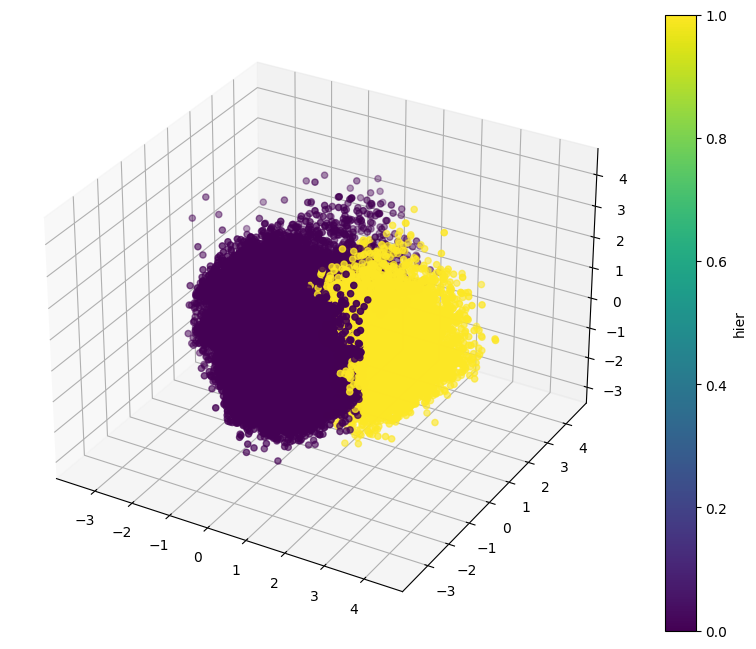

In [21]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(df_pca["col1"], df_pca["col2"], df_pca["col3"], cmap="viridis", c=df_pca["hier"])

color_bar = fig.colorbar(scatter, ax=ax)
color_bar.set_label("hier")

plt.show()

In [22]:
px.scatter_3d(df_pca, x="col1", y="col2", z="col3", color="hier")

Judging by the results, it appears that the hierarchical clustering graph performs worse compared to k-means clustering

## DBSCAN clustering

For the DBSCAN technique, instead of determining the best number of clusters,it needs to decide on the optimal values for eps and min_samples. Both of these parameters can be tuned using the same method which is silhouette score

In [35]:
param_grid = {
    'eps': np.arange(0.1, 2.0, 0.1),
    'min_samples': np.arange(2, 10, 1)
}
 
best_params=None
best_score=0
i=1

for params in ParameterGrid(param_grid):
    dbscan_model = DBSCAN(eps=params['eps'], min_samples=params["min_samples"])
    dbscan_model = dbscan_model.fit_predict(df_pca)
    
    score=-1
    if (len(np.unique(dbscan_model)) > 1) and (len(np.unique(dbscan_model)) < len(df_pca)):
        score = silhouette_score(df_pca, dbscan_model)
        if score > best_score:
            best_score = score
            best_params = params
            
    print(f"i: {i}, param: eps={params['eps']}, min_samples={params['min_samples']}, score= {score}")
    i += 1
        
print("parameter terbaik: ")
print("best eps: ", best_params["eps"])
print("best min_samples: ", best_params["min_samples"])
print("best score: ", best_score)

i: 1, param: eps=0.1, min_samples=2, score= -0.5484620687086037
i: 2, param: eps=0.1, min_samples=3, score= -0.5859133733380416
i: 3, param: eps=0.1, min_samples=4, score= -0.60168919110522
i: 4, param: eps=0.1, min_samples=5, score= -0.5880704449973553
i: 5, param: eps=0.1, min_samples=6, score= -0.5980442914352274
i: 6, param: eps=0.1, min_samples=7, score= -0.5742130567154545
i: 7, param: eps=0.1, min_samples=8, score= -0.5645997344170315
i: 8, param: eps=0.1, min_samples=9, score= -0.5275553874911961
i: 9, param: eps=0.2, min_samples=2, score= -0.5630454233975911
i: 10, param: eps=0.2, min_samples=3, score= -0.485743903289251
i: 11, param: eps=0.2, min_samples=4, score= -0.3922818775450135
i: 12, param: eps=0.2, min_samples=5, score= -0.44478170569315495
i: 13, param: eps=0.2, min_samples=6, score= -0.42461622759937057
i: 14, param: eps=0.2, min_samples=7, score= -0.3213877747480241
i: 15, param: eps=0.2, min_samples=8, score= -0.3101025472172969
i: 16, param: eps=0.2, min_samples=

In [36]:
dbscan_model = DBSCAN(eps=0.8, min_samples=7)
predict = dbscan_model.fit_predict(df_pca)

df_clean["dbscan"] = predict
df_clean["dbscan"].value_counts()

dbscan
 0    41220
-1       10
Name: count, dtype: int64

After inserting the optimal values through the loop, the algorithm assigns only 2 clusters. The presence of just two labels, 0 and -1, suggests that DBSCAN could only identify one cluster and considered the remaining points as noise.  Given this information, it seems that this approach yields extremelly poor results

In [37]:
df_clean["dbscan"] = df_clean["dbscan"]
df_enco["dbscan"] = df_clean["dbscan"]
df_pca["dbscan"] = df_clean["dbscan"]
df_pca.head()

,col1,col2,col3,dbscan
0,0.064624,1.749582,1.244061,0.0
1,1.060785,0.976035,-0.611480,0.0
2,1.280123,0.419402,0.404345,0.0
3,-1.189431,1.488886,-1.060774,0.0
4,2.833882,0.580103,1.261590,0.0


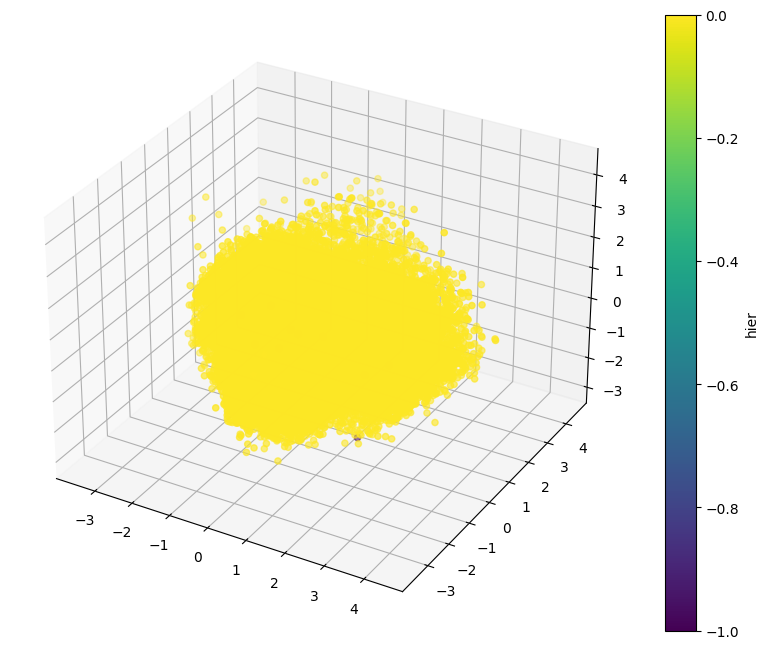

In [38]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(df_pca["col1"], df_pca["col2"], df_pca["col3"], cmap="viridis", c=df_pca["dbscan"])

color_bar = fig.colorbar(scatter, ax=ax)
color_bar.set_label("hier")

plt.show()

In [39]:
px.scatter_3d(df_pca, x="col1", y="col2", z="col3", color="dbscan")

DBSCAN failed to cluster the data effectively, as indicated by the extremely imbalanced frequencies in each cluster. The clusters generated were labeled as 0 and -1.

### Reasons?
This phenomenon occurred because of the spherical shape of the data. DBSCAN isn't well-suited for this type of data; spherical clusters are better handled by k-means.